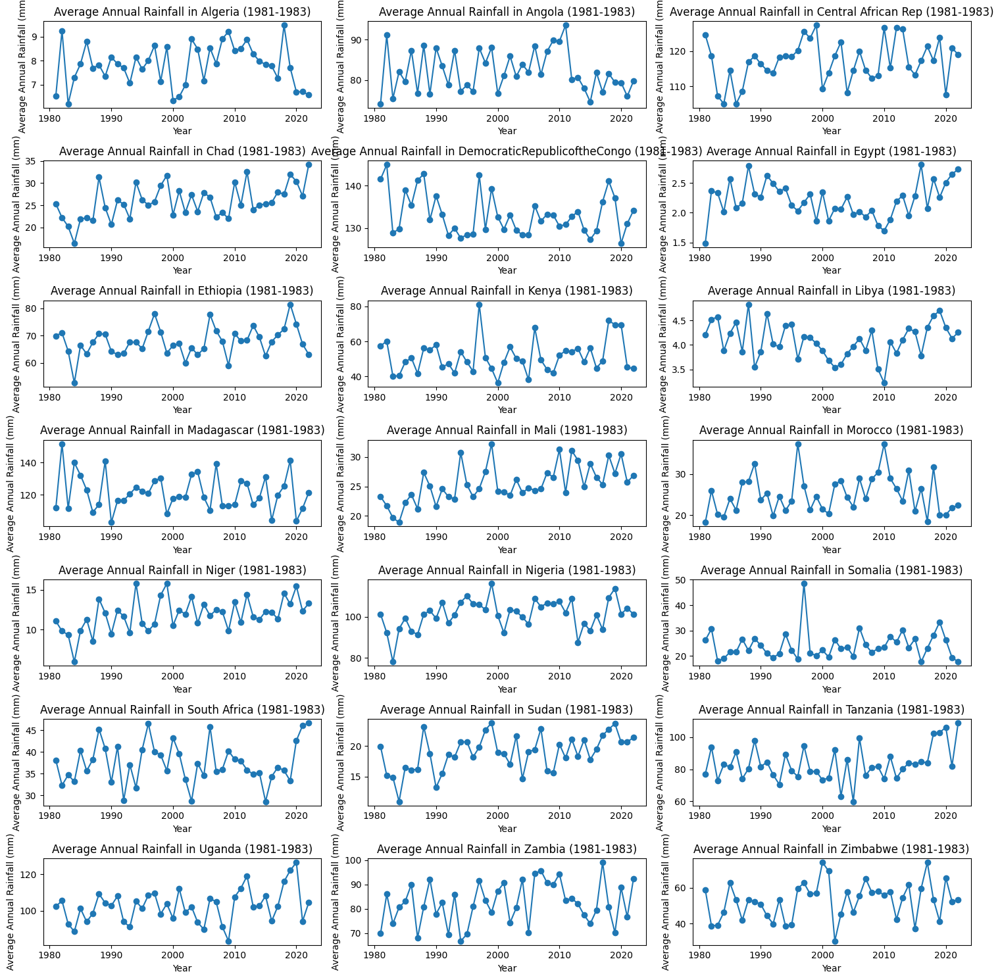

In [30]:
import matplotlib.pyplot as plt
import pandas as pd
import os

# Define the folder containing the CSV files
data_folder = 'data/rainfall_mean'  # Change this to your folder name

# Get a list of all CSV files in the folder
csv_files = [f for f in os.listdir(data_folder) if f.endswith('.csv')]

# Create subplots for each CSV file
num_files = len(csv_files)
num_cols = 3  # You can change the number of columns for subplots
num_rows = (num_files + num_cols - 1) // num_cols  # Calculate the number of rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

for i, csv_file in enumerate(csv_files):
    # Construct the full file path for the current CSV file
    file_path = os.path.join(data_folder, csv_file)

    # Load the data from the current CSV file
    data = pd.read_csv(file_path)

    # Extract the country name from the CSV file
    country_name = data['country_na'].iloc[0]  # Assuming the country name is in the 'country_name' column

    # Create a DataFrame from the data
    df = pd.DataFrame(data)

    # Group data by year and calculate the mean annual rainfall
    annual_rainfall = df.groupby('year')['mean'].mean()

    # Determine the subplot location based on the index
    row = i // num_cols
    col = i % num_cols

    # Create the line plot on the appropriate subplot
    axes[row, col].plot(annual_rainfall.index, annual_rainfall.values, marker='o', linestyle='-')
    axes[row, col].set_title(f'Average Annual Rainfall in {country_name} (1981-1983)')
    axes[row, col].set_xlabel('Year')
    axes[row, col].set_ylabel('Average Annual Rainfall (mm)')

# Adjust the layout
plt.tight_layout()
plt.show()


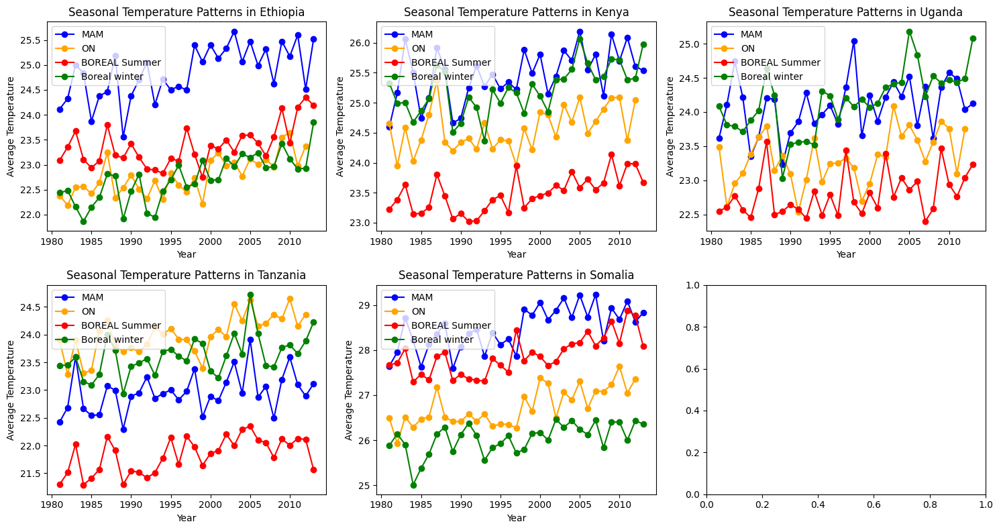

In [19]:
import pandas as pd
import os

# Load the temperature data
temperature_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')  # Replace with the actual file path

# Define the list of African countries
african_countries = [
    "Ethiopia", "Kenya", "Uganda","Tanzania", "Somalia",
]

# Initialize a dictionary to store the correlations
temperature_rainfall_correlations = {}
# Define the months for each season
mild_wet_season_months = [3, 4, 5]
sporadic_wet_season_months = [10, 11]
dry_season_months = [7, 8, 9]
boreal_winter_months = [1, 2, 12]

# Define custom colors for each seasonal pattern
mild_wet_season_color = 'blue'
sporadic_wet_season_color = 'orange'
dry_season_color = 'red'
boreal_winter_color = 'green'

seasons = ['MAM', 'ON', 'BOREAL Summer','Boreal winter']
season_colors = [mild_wet_season_color, sporadic_wet_season_color, dry_season_color, boreal_winter_color]
num_files = len(csv_files)
num_cols = 3  # You can change the number of columns for subplots
num_rows = (4 + num_cols - 1) // num_cols  # Calculate the number of rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 8))

# Loop through each country
for i,country in enumerate(african_countries):
    # Construct the path to the rainfall data file (replace spaces with underscores)
    country_file_name = country.replace(" ", "_")
    rainfall_file_path = os.path.join('data/rainfall_mean', f'Rainfall_{country_file_name}.csv')

    # Check if the file exists
    if os.path.exists(rainfall_file_path):
        # Load the rainfall data for the current country
        rainfall_data = pd.read_csv(rainfall_file_path)

        # Extract year and month from 'year' column in temperature data
        temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
        temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)

        # Cast year and month to float in the rainfall data
        rainfall_data['year'] = rainfall_data['year'].astype(float)
        rainfall_data['month'] = rainfall_data['month'].astype(float)
        merged_data = pd.DataFrame()

        # Merge the dataframes
        merged_data = temperature_data.merge(rainfall_data, on=['year', 'month'])

        # Filter data for the current country
        country_data = merged_data[merged_data['Country'] == country]

        # Calculate the correlation between temperature and rainfall
        correlation = country_data['AverageTemperature'].corr(country_data['mean'])
        row = i // num_cols
        col = i % num_cols
        df = pd.DataFrame(country_data)

        # Store the correlation in the dictionary
        temperature_rainfall_correlations[country] = correlation
        for j, (season, months, color) in enumerate(zip(seasons, [mild_wet_season_months, sporadic_wet_season_months, dry_season_months,boreal_winter_months], season_colors)):
            season_data = pd.concat([df[df['month'] == month] for month in months])
            average_rainfall = season_data.groupby('year')['AverageTemperature'].mean()
            axes[row, col].plot(average_rainfall.index, average_rainfall.values, marker='o', label=season, color=color)
            axes[row, col].set_title(f'Seasonal Temperature Patterns in {country}')  # Remove the ".csv" extension from the filename
            axes[row, col].set_xlabel('Year')
            axes[row, col].set_ylabel('Average Temperature')

            # Add a legend to the subplot
            axes[row, col].legend(loc='upper left')
    else:
        print(f"Rainfall data file not found for {country}")

# # Print the correlations for each country
# for country, correlation in temperature_rainfall_correlations.items():
#     print(f'Correlation between temperature and rainfall in {country}: {correlation}')
#  Adjust the layout
plt.tight_layout()
plt.show()

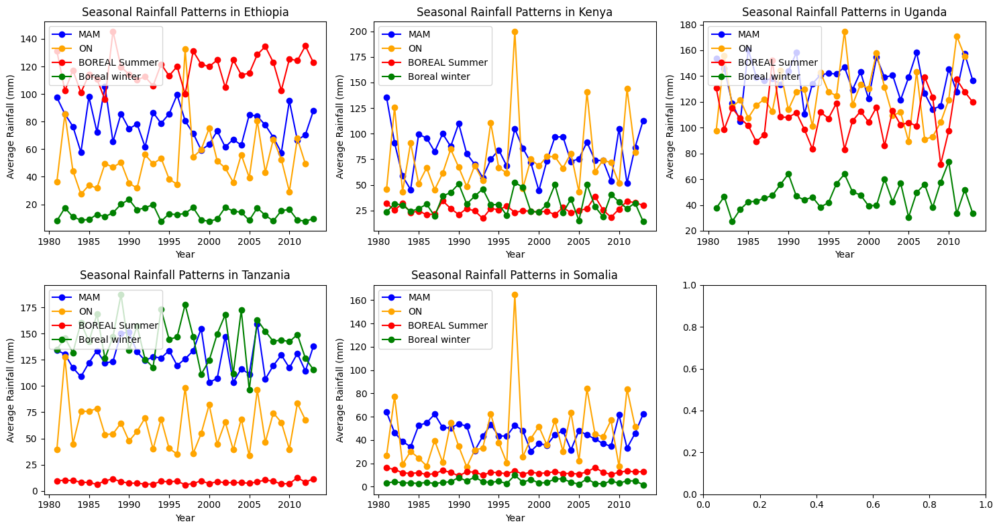

In [18]:
import pandas as pd
import os

# Load the temperature data
temperature_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')  # Replace with the actual file path

# Define the list of African countries
african_countries = [
    "Ethiopia", "Kenya", "Uganda","Tanzania", "Somalia",
]

# Initialize a dictionary to store the correlations
temperature_rainfall_correlations = {}
# Define the months for each season
mild_wet_season_months = [3, 4, 5]
sporadic_wet_season_months = [10, 11]
dry_season_months = [7, 8, 9]
boreal_winter_months = [1, 2, 12]

# Define custom colors for each seasonal pattern
mild_wet_season_color = 'blue'
sporadic_wet_season_color = 'orange'
dry_season_color = 'red'
boreal_winter_color = 'green'

seasons = ['MAM', 'ON', 'BOREAL Summer','Boreal winter']
season_colors = [mild_wet_season_color, sporadic_wet_season_color, dry_season_color, boreal_winter_color]
num_files = len(csv_files)
num_cols = 3  # You can change the number of columns for subplots
num_rows = (4 + num_cols - 1) // num_cols  # Calculate the number of rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 8))

# Loop through each country
for i,country in enumerate(african_countries):
    # Construct the path to the rainfall data file (replace spaces with underscores)
    country_file_name = country.replace(" ", "_")
    rainfall_file_path = os.path.join('data/rainfall_mean', f'Rainfall_{country_file_name}.csv')

    # Check if the file exists
    if os.path.exists(rainfall_file_path):
        # Load the rainfall data for the current country
        rainfall_data = pd.read_csv(rainfall_file_path)

        # Extract year and month from 'year' column in temperature data
        temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
        temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)

        # Cast year and month to float in the rainfall data
        rainfall_data['year'] = rainfall_data['year'].astype(float)
        rainfall_data['month'] = rainfall_data['month'].astype(float)
        merged_data = pd.DataFrame()

        # Merge the dataframes
        merged_data = temperature_data.merge(rainfall_data, on=['year', 'month'])

        # Filter data for the current country
        country_data = merged_data[merged_data['Country'] == country]

        # Calculate the correlation between temperature and rainfall
        correlation = country_data['AverageTemperature'].corr(country_data['mean'])
        row = i // num_cols
        col = i % num_cols
        df = pd.DataFrame(country_data)

        # Store the correlation in the dictionary
        temperature_rainfall_correlations[country] = correlation
        for j, (season, months, color) in enumerate(zip(seasons, [mild_wet_season_months, sporadic_wet_season_months, dry_season_months,boreal_winter_months], season_colors)):
            season_data = pd.concat([df[df['month'] == month] for month in months])
            average_rainfall = season_data.groupby('year')['mean'].mean()
            axes[row, col].plot(average_rainfall.index, average_rainfall.values, marker='o', label=season, color=color)
            axes[row, col].set_title(f'Seasonal Rainfall Patterns in {country}')  # Remove the ".csv" extension from the filename
            axes[row, col].set_xlabel('Year')
            axes[row, col].set_ylabel('Average Rainfall (mm)')

            # Add a legend to the subplot
            axes[row, col].legend(loc='upper left')
    else:
        print(f"Rainfall data file not found for {country}")

# # Print the correlations for each country
# for country, correlation in temperature_rainfall_correlations.items():
#     print(f'Correlation between temperature and rainfall in {country}: {correlation}')
#  Adjust the layout
plt.tight_layout()
plt.show()

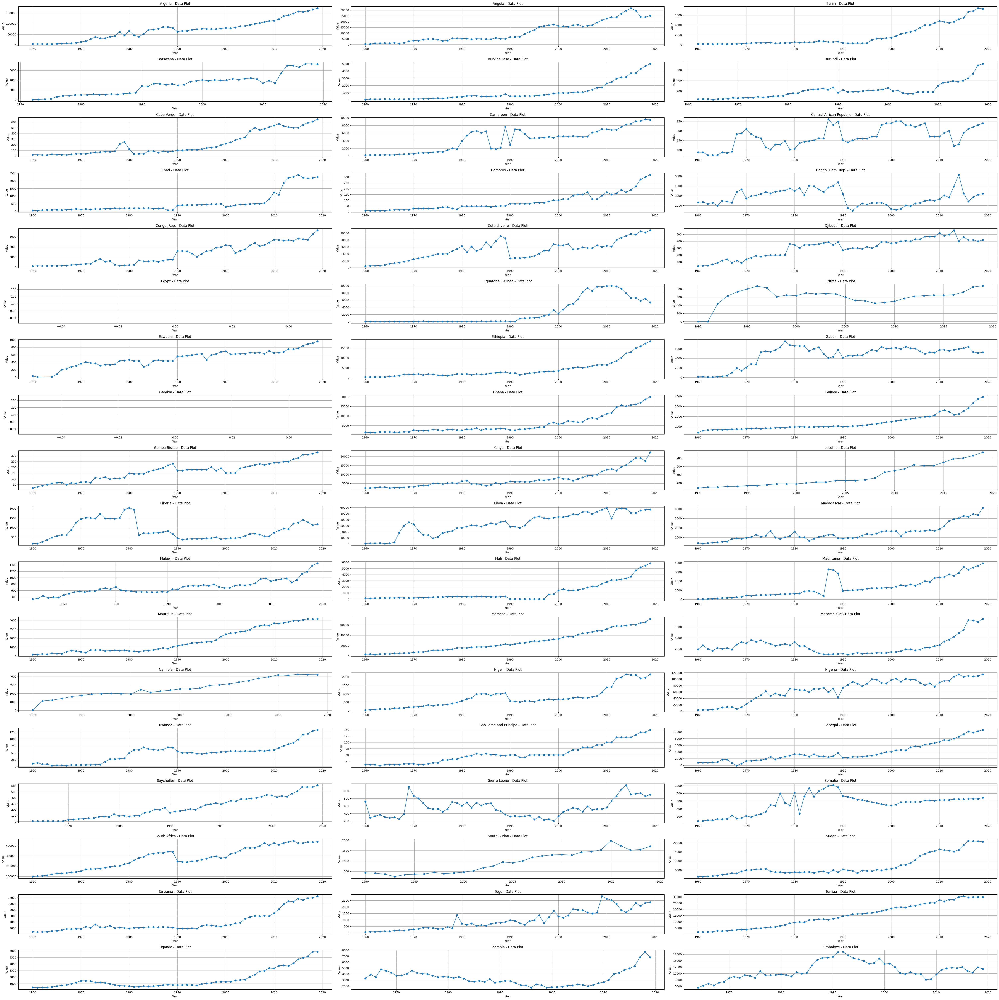

Line plots displayed for African countries.


In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import math
%matplotlib inline

# Load your dataset (example data you provided)
data = pd.read_csv('data/emissions/co2_emissions_kt_by_country.csv')  # Replace with the actual data file path

# Define a list of African countries
african_countries = [
    "Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cabo Verde", "Cameroon",
    "Central African Republic", "Chad", "Comoros", "DemocraticRepublicoftheCongo", "Congo, Rep.", "Cote d'Ivoire",
    "Djibouti", "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana",
    "Guinea", "Guinea-Bissau", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali",
    "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe",
    "Senegal", "Seychelles", "Sierra Leone", "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo",
    "Tunisia", "Uganda", "Zambia", "Zimbabwe",
]

# Calculate the number of rows and columns for subplots
num_countries = len(african_countries)
num_cols = 3  # Number of columns for subplots
num_rows = math.ceil(num_countries / num_cols)  # Calculate the number of rows

# Create subplots for each country
fig, axes = plt.subplots(num_rows, num_cols, figsize=(50, 50))

# Iterate through African countries and create line plots
for i, country in enumerate(african_countries):
    row = i // num_cols
    col = i % num_cols
    country_data = data[data['country_name'] == country]
    
    # Create a line plot for the country's data in the subplot
    axes[row, col].plot(country_data['year'], country_data['value'], marker='o', linestyle='-')
    axes[row, col].set_title(f'{country} - Data Plot')
    axes[row, col].set_xlabel('Year')
    axes[row, col].set_ylabel('Value')
    axes[row, col].grid(True)

# Adjust the layout
plt.tight_layout()
plt.show()

print('Line plots displayed for African countries.')


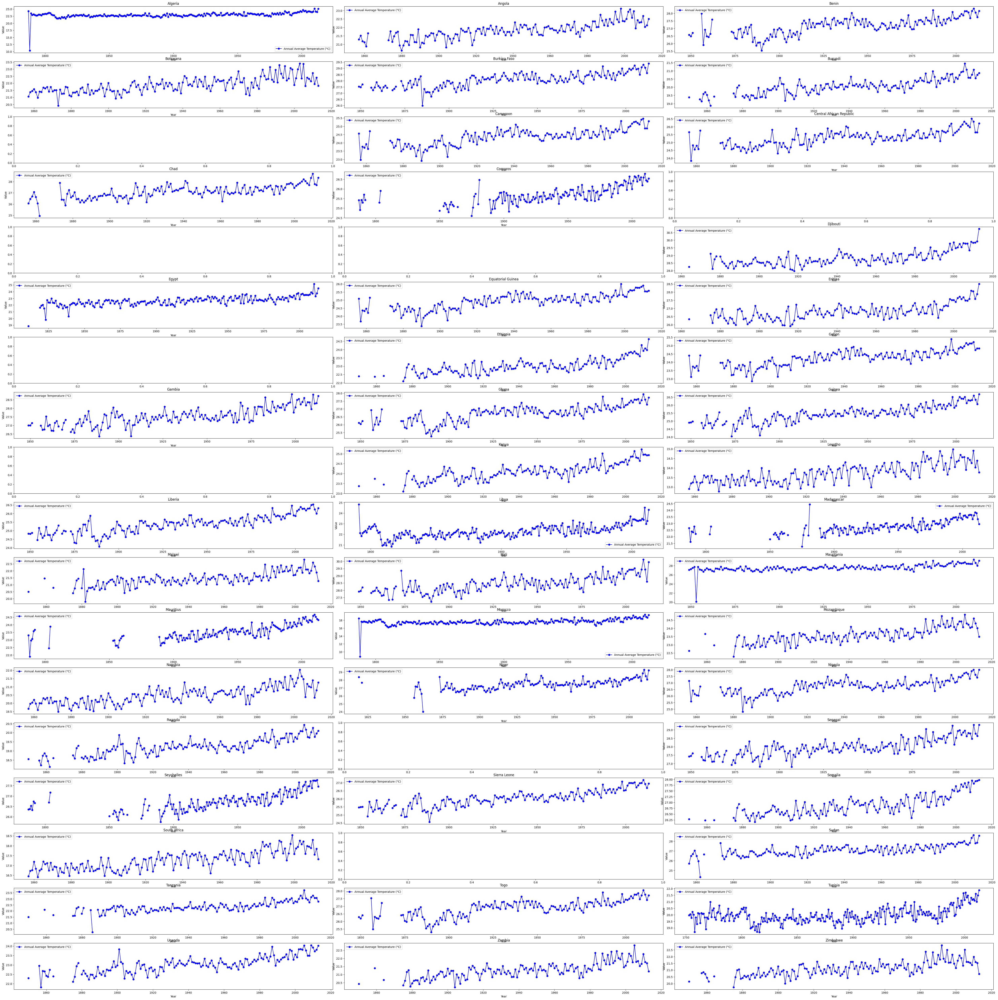

In [61]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your data from the CSV file (replace 'your_data.csv' with the actual filename)
data = pd.read_csv('./data/GlobalLandTemperaturesByCountry.csv')

# Assuming the data contains columns 'dt', 'AverageTemperature', 'AverageTemperatureUncertainty', 'Country', and 'Precipitation'
# You may need to adjust the column names to match your actual data

# Define the list of African countries
african_countries = [
    "Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cabo Verde", "Cameroon",
    "Central African Republic", "Chad", "Comoros", "DemocraticRepublicoftheCongo", "Congo, Rep.", "Cote d'Ivoire",
    "Djibouti", "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana",
    "Guinea", "Guinea-Bissau", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali",
    "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe",
    "Senegal", "Seychelles", "Sierra Leone", "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo",
    "Tunisia", "Uganda", "Zambia", "Zimbabwe",
]

# Group data by 'Country' for subplots
grouped_data = data.groupby('Country')

# Calculate the number of subplots required
num_subplots = len(african_countries)
num_cols = 3  # Number of columns for subplots
num_rows = (num_subplots - 1) // num_cols + 1

# Create subplots for each country
fig, axes = plt.subplots(num_rows, num_cols, figsize=(50, 50))
fig.tight_layout()

# Iterate through African countries and create a subplot for each
for idx, country in enumerate(african_countries):
    if country in grouped_data.groups:
        row = idx // num_cols
        col = idx % num_cols

        ax = axes[row, col]
        
        country_data = grouped_data.get_group(country)
        years = pd.to_datetime(country_data['dt']).dt.year
        average_temperature = country_data.groupby(years)['AverageTemperature'].mean()
        years = average_temperature.index

        # Plot annual average temperature
        ax.plot(years, average_temperature, label='Annual Average Temperature (°C)', color='blue', marker='o', linestyle='-')

        # Customize labels and legend
        ax.set_title(country)
        ax.set_xlabel('Year')
        ax.set_ylabel('Value')
        ax.legend()

# Display the subplots
plt.show()


In [93]:
import pandas as pd
import os

# Load the temperature data
temperature_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')  # Replace with the actual file path

# Define the list of African countries
african_countries = [
    "Algeria", "Angola",
    "Central African Republic", "Chad", "Ethiopia", "Kenya",  "Libya", "Madagascar", "Mali", "Morocco", "Niger", "Nigeria", "Somalia", "South Africa", "Zambia", "Zimbabwe",
]

# Initialize a dictionary to store the correlations
temperature_rainfall_correlations = {}

# Loop through each country
for country in african_countries:
    # Construct the path to the rainfall data file (replace spaces with underscores)
    country_file_name = country.replace(" ", "_")
    rainfall_file_path = os.path.join('data/rainfall_mean', f'Rainfall_{country_file_name}.csv')

    # Check if the file exists
    if os.path.exists(rainfall_file_path):
        # Load the rainfall data for the current country
        rainfall_data = pd.read_csv(rainfall_file_path)

        # Extract year and month from 'year' column in temperature data
        temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
        temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)

        # Cast year and month to float in the rainfall data
        rainfall_data['year'] = rainfall_data['year'].astype(float)
        rainfall_data['month'] = rainfall_data['month'].astype(float)
        merged_data = pd.DataFrame()

        # Merge the dataframes
        merged_data = temperature_data.merge(rainfall_data, on=['year', 'month'])

        # Filter data for the current country
        country_data = merged_data[merged_data['Country'] == country]

        # Calculate the correlation between temperature and rainfall
        correlation = country_data['AverageTemperature'].corr(country_data['mean'])

        # Store the correlation in the dictionary
        temperature_rainfall_correlations[country] = correlation
    else:
        print(f"Rainfall data file not found for {country}")

# # Print the correlations for each country
# for country, correlation in temperature_rainfall_correlations.items():
#     print(f'Correlation between temperature and rainfall in {country}: {correlation}')


In [102]:
import pandas as pd
import os

# Define the list of African countries
african_countries = [
    "Algeria", "Angola",
    "Central African Republic", "Chad", "Ethiopia", "Kenya",  "Libya", "Madagascar", "Mali", "Morocco", "Niger", "Nigeria", "Somalia", "South Africa", "Zambia", "Zimbabwe",
]

# Initialize dictionaries to store correlations for temperature and CO2 emissions
temperature_co2_correlations = {}
rainfall_co2_correlations = {}

# Loop through each country
for country in african_countries:
    # Construct the path to the rainfall data file (replace spaces with underscores)
    country_file_name = country.replace(" ", "_")
    rainfall_file_path = os.path.join('data/rainfall_mean', f'Rainfall_{country_file_name}.csv')

    # Check if the file exists
    if os.path.exists(rainfall_file_path):
        # Load the temperature data (assuming it's already loaded)
        temp_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')
        
        group_data = temp_data.groupby('Country')
        temperature_data = group_data.get_group(country)

        temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
        temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)
        merged_rainfall_data = pd.DataFrame()
        merged_temperature_data = pd.DataFrame()

        # Load the rainfall data for the current country
        rainfall_data = pd.read_csv(rainfall_file_path)
        average_rainfall = rainfall_data.groupby('year')['mean'].mean().reset_index()
        average_temperature = temperature_data.groupby('year')['AverageTemperature'].mean().reset_index()

        # Take only one row per year, for example, the first row
        one_row_per_year_rain = average_rainfall.groupby('year').first().reset_index()
        one_row_per_year_temperature = average_temperature.groupby('year').first().reset_index()

        # Load the CO2 emissions data for all countries (assuming it's in a single file)
        co2_temp_data = pd.read_csv('data/emissions/co2_emissions_kt_by_country.csv')
        grouped_data = co2_temp_data.groupby('country_name')
        co2_data = grouped_data.get_group(country)

        # Merge the dataframes based on 'year' and filter by the current country
        country_rainfall_data = one_row_per_year_rain.merge(co2_data, on='year')
        country_temperature_data = one_row_per_year_temperature.merge(co2_data, on='year')
        
        # country_rainfall_data = merged_rainfall_data[merged_rainfall_data['country_name'] == country]
        # country_temperature_data = merged_temperature_data[merged_temperature_data['country_name'] == country]

        # Calculate the correlation between rainfall and CO2 emissions for the current country
        rainfall_correlation = country_rainfall_data['mean'].corr(country_rainfall_data['value'])
        temperature_correlation = country_temperature_data['AverageTemperature'].corr(country_temperature_data['value'])

        # Store the correlations in the respective dictionaries
        temperature_co2_correlations[country] = temperature_correlation
        rainfall_co2_correlations[country] = rainfall_correlation
    else:
        print(f"Rainfall data file not found for {country}")

# # Print the correlations for each country
# for country in african_countries:
#     print(f'Correlation between temperature and CO2 emissions in {country}: {temperature_co2_correlations[country]}')
#     print(f'Correlation between rainfall and CO2 emissions in {country}: {rainfall_co2_correlations[country]}')


C:\Users\Keerthi\AppData\Local\Temp\ipykernel_25672\2129300068.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
C:\Users\Keerthi\AppData\Local\Temp\ipykernel_25672\2129300068.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)
C:\Users\Keerthi\AppData\Local\Temp\ipykernel_25672\2129300068.py:28: SettingWithCopyWarning: 
A value

In [103]:
correlation_df = pd.DataFrame({
    'Country': african_countries,
    'Temp vs Rainfall Correlation': [temperature_rainfall_correlations[country] for country in african_countries],
    'Temp vs CO2 Correlation': [temperature_co2_correlations[country] for country in african_countries],
    'Rainfall vs CO2 Correlation': [rainfall_co2_correlations[country] for country in african_countries]
})

# Print the DataFrame
correlation_df

,Country,Temp vs Rainfall Correlation,Temp vs CO2 Correlation,Rainfall vs CO2 Correlation
0,Algeria,-0.566022,0.716183,0.273007
1,Angola,0.649438,0.579849,-0.014299
2,Central African Republic,-0.279361,0.479440,0.035727
3,Chad,0.430055,0.600999,0.334780
4,Ethiopia,0.279591,0.867334,0.356752
5,Kenya,0.119512,0.770905,0.263673
6,Libya,-0.904992,0.736124,-0.198574
7,Madagascar,0.716788,0.477810,0.054875
8,Mali,0.473422,0.567712,0.457033
9,Morocco,-0.690594,0.717885,0.175641


In [ ]:
import pandas as pd
import os

# Load the temperature data
temp_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')  # Replace with the actual file path

# Define the list of African countries
african_countries = [
    "Algeria", "Angola", "DemocraticRepublicoftheCongo",
    "Central African Republic", "Chad", "Ethiopia", "Kenya",  "Libya", "Madagascar", "Mali", "Morocco", "Niger", "Nigeria", "Somalia", "South Africa", "Zambia", "Zimbabwe",
]

# Initialize a dictionary to store the correlations
temperature_rainfall_correlations = {}

# Loop through each country
for country in african_countries:
    # Construct the path to the rainfall data file (replace spaces with underscores)
    country_file_name = country.replace(" ", "_")
    rainfall_file_path = os.path.join('data/rainfall_mean', f'Rainfall_{country_file_name}.csv')

    # Check if the file exists
    if os.path.exists(rainfall_file_path):
        # Load the rainfall data for the current country
        rainfall_data = pd.read_csv(rainfall_file_path)
        group_data = temp_data.groupby('Country')
        temperature_data = group_data.get_group(country)

        # Extract year and month from 'year' column in temperature data
        temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
        temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)

        # Cast year and month to float in the rainfall data
        rainfall_data['year'] = rainfall_data['year'].astype(float)
        rainfall_data['month'] = rainfall_data['month'].astype(float)

        # Calculate annual average temperature and rainfall
        annual_mean_temperature = temperature_data.groupby(['Country', 'year'])['AverageTemperature'].mean().reset_index()
        annual_mean_rainfall = rainfall_data.groupby(['year'])['mean'].mean().reset_index()

        # Merge annual data based on the 'year' column
        merged_data = annual_mean_temperature.merge(annual_mean_rainfall, on='year')
        # print(merged_data)

        # Calculate the correlation between annual temperature and rainfall
        correlation = merged_data['AverageTemperature'].corr(merged_data['mean'])

        # Store the correlation in the dictionary
        temperature_rainfall_correlations[country] = correlation

    else:
        print(f"Rainfall data file not found for {country}")

# # Print the correlations for each country
# for country, correlation in temperature_rainfall_correlations.items():
#     print(f'Correlation between annual temperature and rainfall in {country}: {correlation}')


C:\Users\Keerthi\AppData\Local\Temp\ipykernel_344\852833020.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
C:\Users\Keerthi\AppData\Local\Temp\ipykernel_344\852833020.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are i

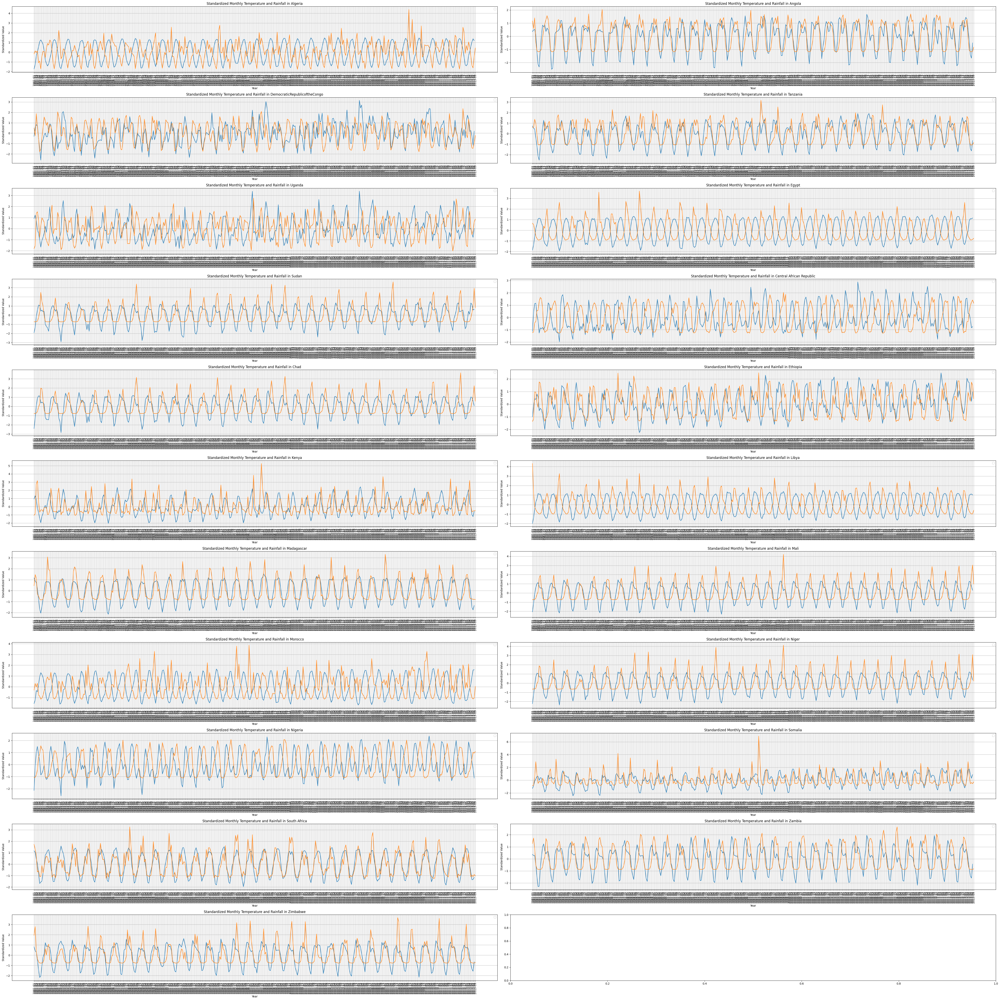

In [5]:
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Load the temperature data
temp_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')  # Replace with the actual file path

# Define the list of African countries
african_countries = [
    "Algeria", "Angola","DemocraticRepublicoftheCongo","Tanzania","Uganda","Egypt","Sudan",
    "Central African Republic", "Chad", "Ethiopia", "Kenya",  "Libya", "Madagascar", "Mali", "Morocco", "Niger", "Nigeria", "Somalia", "South Africa", "Zambia", "Zimbabwe",
]

# Calculate the number of rows and columns for subplots
num_countries = len(african_countries)
num_cols = 2  # Number of columns for subplots
num_rows = (num_countries + num_cols - 1) // num_cols  # Calculate the number of rows

# Initialize a dictionary to store standardized data
standardized_data = {}

# Create subplots for all countries
fig, axes = plt.subplots(num_rows, num_cols, figsize=(50, 50))

# Loop through each country
for i, country in enumerate(african_countries):
    # Construct the path to the rainfall data file (replace spaces with underscores)
    country_file_name = country.replace(" ", "_")
    rainfall_file_path = os.path.join('data/rainfall_mean', f'Rainfall_{country_file_name}.csv')  # Use monthly rainfall data

    # Check if the file exists
    if os.path.exists(rainfall_file_path):
        # Load the monthly rainfall data for the current country
        rainfall_data = pd.read_csv(rainfall_file_path)
        group_data = temp_data.groupby('Country')
        temperature_data = group_data.get_group(country)

        # Extract year and month from 'year' column in temperature data
        temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
        temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)

        # Cast year and month to float in the rainfall data
        rainfall_data['year'] = rainfall_data['year'].astype(float)
        rainfall_data['month'] = rainfall_data['month'].astype(float)

        # Merge monthly data based on the 'year' and 'month' columns
        merged_data = temperature_data.merge(rainfall_data, on=['year', 'month'])

        # Standardize the data
        scaler = StandardScaler()
        standardized_merged_data = pd.DataFrame(scaler.fit_transform(merged_data[['AverageTemperature', 'mean']]), columns=['StandardizedTemperature', 'StandardizedRainfall'])

        # Store the standardized data in the dictionary
        standardized_data[country] = standardized_merged_data

        # Determine the subplot location
        row = i // num_cols
        col = i % num_cols

        # Create a subplot for the current country
        ax = axes[row, col]

        # Plot the standardized data in the subplot
        ax.plot(standardized_merged_data['StandardizedTemperature'])
        ax.plot(standardized_merged_data['StandardizedRainfall'])
        ax.set_title(f'Standardized Monthly Temperature and Rainfall in {country}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Standardized Value')
        ax.legend()
        ax.grid(True)
        ticks = range(0, len(standardized_merged_data))
        tick_labels = [f"{int(year)}-{int(month):02d}" for year, month in zip(merged_data['year'], merged_data['month'])]
        ax.set_xticks(ticks)
        ax.set_xticklabels(tick_labels, rotation=90)  # Rotate labels for readability

# Adjust the layout
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Load the temperature data
temp_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')  # Replace with the actual file path

# Define the list of African countries
african_countries = [
    "Algeria", "Angola","DemocraticRepublicoftheCongo","Tanzania","Uganda","Egypt","Sudan",
    "Central African Republic", "Chad", "Ethiopia", "Kenya",  "Libya", "Madagascar", "Mali", "Morocco", "Niger", "Nigeria", "Somalia", "South Africa", "Zambia", "Zimbabwe",
]

# Calculate the number of rows and columns for subplots
num_countries = len(african_countries)
num_cols = 2  # Number of columns for subplots
num_rows = (num_countries + num_cols - 1) // num_cols  # Calculate the number of rows

# Initialize a dictionary to store standardized data
standardized_data = {}

# Create subplots for each country
fig, axes = plt.subplots(num_rows, num_cols, figsize=(50, 50))
output_directory = 'output_plots'
os.makedirs(output_directory, exist_ok=True)
# Loop through each country
for i, country in enumerate(african_countries):
    # Construct the path to the rainfall data file (replace spaces with underscores)
    country_file_name = country.replace(" ", "_")
    rainfall_file_path = os.path.join('data/rainfall_mean', f'Rainfall_{country_file_name}.csv')  # Use monthly rainfall data

    # Check if the file exists
    if os.path.exists(rainfall_file_path):
        # Load the monthly rainfall data for the current country
        rainfall_data = pd.read_csv(rainfall_file_path)
        group_data = temp_data.groupby('Country')
        temperature_data = group_data.get_group(country)

        # Extract year and month from 'year' column in temperature data
        temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
        temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)

        # Cast year and month to float in the rainfall data
        rainfall_data['year'] = rainfall_data['year'].astype(float)
        rainfall_data['month'] = rainfall_data['month'].astype(float)

        # Merge monthly data based on the 'year' and 'month' columns
        merged_data = temperature_data.merge(rainfall_data, on=['year', 'month'])

        # Standardize the data
        scaler = StandardScaler()
        standardized_merged_data = pd.DataFrame(scaler.fit_transform(merged_data[['AverageTemperature', 'mean']]), columns=['StandardizedTemperature', 'StandardizedRainfall'])

        # Store the standardized data in the dictionary
        standardized_data[country] = standardized_merged_data

        # Determine the subplot location
        row = i // num_cols
        col = i % num_cols

        # Create a subplot for the current country
        ax = axes[row, col]

        # Plot the standardized data in the subplot
        ax.plot(standardized_merged_data['StandardizedTemperature'], label='Standardized Temperature')
        ax.plot(standardized_merged_data['StandardizedRainfall'], label='Standardized Rainfall')
        ax.set_title(f'Standardized Monthly Temperature and Rainfall in {country}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Standardized Value')
        ax.legend()
        # ax.grid(True)
        ticks = range(0, len(standardized_merged_data))
        tick_labels = [f"{int(year)}-{int(month):02d}" for year, month in zip(merged_data['year'], merged_data['month'])]
        ax.set_xticks(ticks)
        ax.set_xticklabels(tick_labels, rotation=90)  # Rotate labels for readability
        
        output_file = os.path.join(output_directory, f'{country}_standardized_plot.png')
        plt.savefig(output_file)

        # ...

        # After the loop
        plt.close()  # Close the figure to release resources

        # Optionally, you can print a message to confirm the saved images
        print(f'Plots saved as images in directory: {output_directory}')


# Adjust the layout
plt.tight_layout()
plt.show()


C:\Users\Keerthi\AppData\Local\Temp\ipykernel_18364\1845644700.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
C:\Users\Keerthi\AppData\Local\Temp\ipykernel_18364\1845644700.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)


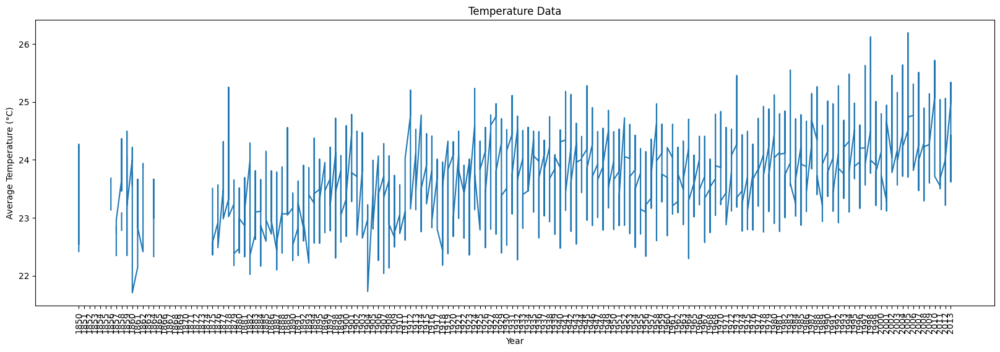

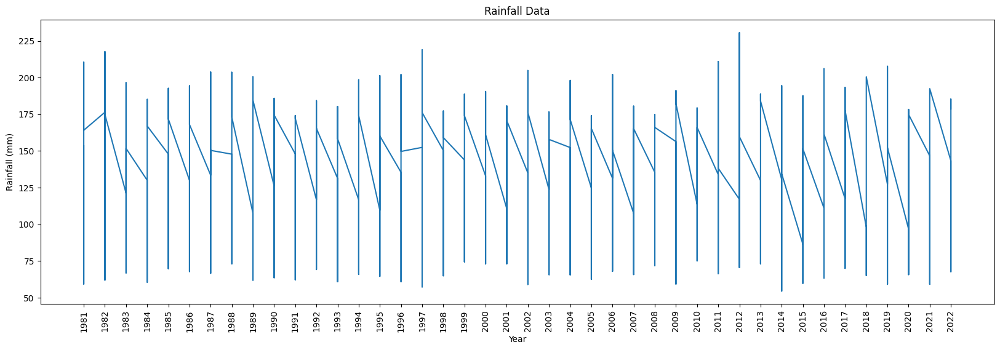

In [43]:
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Load the temperature data
temp_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')  # Replace with the actual file path

# Filter data for the Democratic Republic of the Congo
temperature_data = temp_data[temp_data['Country'] == "DemocraticRepublicoftheCongo"]

# Extract year and month from 'dt' column in temperature data
temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)

# Construct the file path for the rainfall data
rainfall_file_path = os.path.join('data/rainfall_mean', 'Rainfall_DemocraticRepublicoftheCongo.csv')  # Use monthly rainfall data

# Load the rainfall data
rainfall_data = pd.read_csv(rainfall_file_path)

# Plot the temperature data
plt.figure(figsize=(20, 6))
  # 2 rows, 1 column, first subplot
plt.plot(temperature_data['year'], temperature_data['AverageTemperature'])
plt.title('Temperature Data')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.tick_params(axis='x', rotation=90)
plt.xticks(temperature_data['year'].unique())
plt.show()

plt.figure(figsize=(20, 6))
# Plot the rainfall data
 # 2 rows, 1 column, second subplot
plt.plot(rainfall_data['year'], rainfall_data['mean'])
plt.title('Rainfall Data')
plt.xlabel('Year')
plt.ylabel('Rainfall (mm)')

plt.tick_params(axis='x', rotation=90)
plt.xticks(rainfall_data['year'].unique())
plt.show()



C:\Users\Keerthi\AppData\Local\Temp\ipykernel_18364\4285844383.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
C:\Users\Keerthi\AppData\Local\Temp\ipykernel_18364\4285844383.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)
C:\Users\Keerthi\AppData\Local\Temp\ipykernel_18364\4285844383.py:41: SettingWithCopyWarning: 
A value

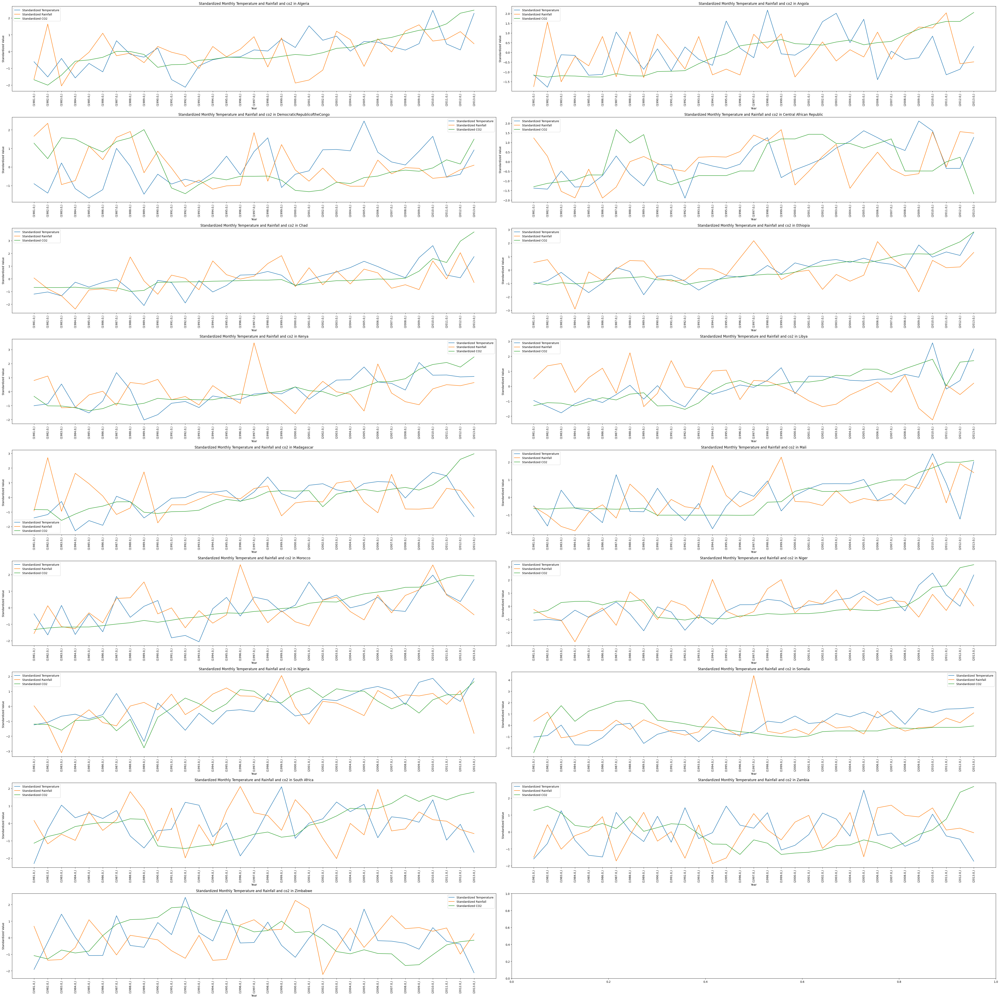

In [29]:
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Load the temperature data
temp_data = pd.read_csv('data/GlobalLandTemperaturesByCountry.csv')  # Replace with the actual file path

# Define the list of African countries
african_countries = [
    "Algeria", "Angola", "DemocraticRepublicoftheCongo",
    "Central African Republic", "Chad", "Ethiopia", "Kenya",  "Libya", "Madagascar", "Mali", "Morocco", "Niger", "Nigeria", "Somalia", "South Africa", "Zambia", "Zimbabwe",
]

# Calculate the number of rows and columns for subplots
num_countries = len(african_countries)
num_cols = 2  # Number of columns for subplots
num_rows = (num_countries + num_cols - 1) // num_cols  # Calculate the number of rows

# Initialize a dictionary to store standardized data
standardized_data = {}

# Create subplots for each country
fig, axes = plt.subplots(num_rows, num_cols, figsize=(50, 50))
output_directory = 'output_plots'
os.makedirs(output_directory, exist_ok=True)
# Loop through each country
for i, country in enumerate(african_countries):
    # Construct the path to the rainfall data file (replace spaces with underscores)
    country_file_name = country.replace(" ", "_")
    rainfall_file_path = os.path.join('data/rainfall_mean', f'Rainfall_{country_file_name}.csv')  # Use monthly rainfall data

    # Check if the file exists
    if os.path.exists(rainfall_file_path):
        # Load the monthly rainfall data for the current country
        rainfall_data = pd.read_csv(rainfall_file_path)
        group_data = temp_data.groupby('Country')
        temperature_data = group_data.get_group(country)

        # Extract year and month from 'year' column in temperature data
        temperature_data['year'] = temperature_data['dt'].str.extract(r'(\d{4})').astype(float)
        temperature_data['month'] = temperature_data['dt'].str.extract(r'-(\d{2})').astype(float)
        average_rainfall = rainfall_data.groupby('year')['mean'].mean().reset_index()
        average_temperature = temperature_data.groupby('year')['AverageTemperature'].mean().reset_index()

        # Take only one row per year, for example, the first row
        one_row_per_year_rain = average_rainfall.groupby('year').first().reset_index()
        one_row_per_year_temperature = average_temperature.groupby('year').first().reset_index()

        merged_data = pd.DataFrame()
        # Merge monthly data based on the 'year' and 'month' columns
        merged_data = one_row_per_year_temperature.merge(one_row_per_year_rain, on='year')
        co2_temp_data = pd.read_csv('data/emissions/co2_emissions_kt_by_country.csv')
        grouped_data = co2_temp_data.groupby('country_name')
        co2_data = grouped_data.get_group(country)
        merged_data = merged_data.merge(co2_data, on='year')

        # Standardize the data
        scaler = StandardScaler()
        standardized_merged_data = pd.DataFrame(scaler.fit_transform(merged_data[['AverageTemperature', 'mean','value']]), columns=['StandardizedTemperature', 'StandardizedRainfall','StandardizedCO2'])

        # Store the standardized data in the dictionary
        standardized_data[country] = standardized_merged_data

        # Determine the subplot location
        row = i // num_cols
        col = i % num_cols

        # Create a subplot for the current country
        ax = axes[row, col]

        # Plot the standardized data in the subplot
        ax.plot(standardized_merged_data['StandardizedTemperature'], label='Standardized Temperature')
        ax.plot(standardized_merged_data['StandardizedRainfall'], label='Standardized Rainfall')
        ax.plot(standardized_merged_data['StandardizedCO2'], label='Standardized CO2')
        ax.set_title(f'Standardized Monthly Temperature and Rainfall and co2 in {country}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Standardized Value')
        ax.legend()
        # ax.grid(True)
        ticks = range(0, len(standardized_merged_data))
        tick_labels = [f"{year}" for year in zip(merged_data['year'])]
        ax.set_xticks(ticks)
        ax.set_xticklabels(tick_labels, rotation=90)  # Rotate labels for readability
        
        # output_file = os.path.join(output_directory, f'{country}_standardized_plot.png')
        # plt.savefig(output_file)

        # ...

        # After the loop
        # plt.close()  # Close the figure to release resources

        # Optionally, you can print a message to confirm the saved images
        # print(f'Plots saved as images in directory: {output_directory}')


# Adjust the layout
plt.tight_layout()
plt.show()
